<a href="https://colab.research.google.com/github/FKz11/NLP/blob/main/lesson_16.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# lesson-16

## Создание чат-бота в Telegram

Интенты:

1). Диалог - gpt

2). Вопрос-ответ по базе - bert vec + knn

3). Текущие дата и время

4). Прогноз погоды на 5 дней

Классификация интентов - bert

### Библиотеки:

In [1]:
!pip install -qq transformers

     |████████████████████████████████| 5.5 MB 12.8 MB/s 
     |████████████████████████████████| 182 kB 56.0 MB/s 
     |████████████████████████████████| 7.6 MB 48.3 MB/s 


In [2]:
import requests
import bs4

import tarfile

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
from torch.utils.data import DataLoader

from transformers import GPT2LMHeadModel, BertModel
from transformers import GPT2Tokenizer, BertTokenizerFast

from transformers import DataCollatorForLanguageModeling, TextDataset, TrainingArguments, Trainer

from sklearn.neighbors import NearestNeighbors

import pickle

## 1). Диалог

### Данные:

Возьмём диалоги из анекдотов, чтобы переписываться с ботом было интереснее

https://github.com/Koziev/NLP_Datasets/blob/master/Conversations/Data/extract_dialogues_from_anekdots.tar.xz

In [3]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
data_dialog = []

tar = tarfile.open("/content/gdrive/MyDrive/Colab Notebooks/extract_dialogues_from_anekdots.tar.xz", "r:xz")
for member in tar.getmembers():
     f = tar.extractfile(member)
     if f is not None:
         content = f.read().decode('utf-8')
         content = content.split('\n\n\n\n')
         data_dialog.extend(content)

In [5]:
data_dialog[:10]

['- Как водичка ?\n- А я здесь как женшина сижу, а не как термометр.',
 '- Я затрудняюсь поставить вам диагноз ... Наверное, это алкоголизм.\n- Хорошо, доктор. Я приду, когда Вы будете трезвым.',
 '- Что такое дефицит в маркистском понимании?\n- Это объективная реальность, не данная нам в ощущениях.\n- Это вы в идеалистическом понимании, а в практическом?\n- Объективная реальность данная в ощущениях, но не нам.',
 '- Можно у вас срочно отремонтировать часы?\n- Нет\n- Что такое\n- Нет\n- А что здесь делают?\n- Здесь делают обрезание\n- Тогда какого черта вы повесили циферблат над входом?\n- А что б вы хотели, чтоб мы там повесили?',
 '- Из-за тебя я проиграл уйму денег!\n- Почему ты не заговорил?\n- Чудак!\n- Ты только представь, сколько денег мы загребем завтра.',
 '- Входите,\n- Через 15 минут вам на операцию. А пока отдыхайте.\n- Сестра!\n- Не обьясните мне, почему вы стучали в дверь перед тем, как войти???',
 '- Я на этом автобусе до вокзала доеду?\n- Нет. Второй чукча: - А я?',
 '-

In [6]:
bos_cls_token_1 = '<q>'
eos_cls_token_1 = '</q>'
bos_cls_token_2 = '<r>'
eos_cls_token_2 = '</r>'
bos_token = '<s>'
eos_token = '</s>'
new_data_dialog = []
for i in range(len(data_dialog)):
  dialog = ''.join(data_dialog[i].split('\n'))[2:].split('- ')
  new_dialog = []
  for j in range(len(dialog)):
    if j%2==0:
      new_dialog.append(bos_cls_token_1+dialog[j]+eos_cls_token_1)
    else:
      new_dialog.append(bos_cls_token_2+dialog[j]+eos_cls_token_2)
  new_data_dialog.append(''.join(new_dialog))
    
df_dialog = pd.DataFrame({'data': new_data_dialog})
df_dialog['data']=bos_token+df_dialog['data']+eos_token
df_dialog.head()

,data
0,<s><q>Как водичка ?</q><r>А я здесь как женшин...
1,<s><q>Я затрудняюсь поставить вам диагноз ... ...
2,<s><q>Что такое дефицит в маркистском понимани...
3,<s><q>Можно у вас срочно отремонтировать часы?...
4,<s><q>Из-за тебя я проиграл уйму денег!</q><r>...


In [7]:
len(df_dialog)

87721

In [8]:
test_size = 0.1
train_len = int((1 - test_size) * len(df_dialog))
df_dialog['data'][:train_len].to_csv('data_dialog_train.txt', sep='\n', index=False)
df_dialog['data'][train_len:].to_csv('data_dialog_test.txt', sep='\n', index=False)

### Модель

In [9]:
tokenizer_gpt = GPT2Tokenizer.from_pretrained("sberbank-ai/rugpt3small_based_on_gpt2", 
                                          bos_token=bos_token, eos_token=eos_token)
gpt_dialog = GPT2LMHeadModel.from_pretrained("sberbank-ai/rugpt3small_based_on_gpt2")

Downloading:   0%|          | 0.00/1.71M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.27M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/608 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/551M [00:00<?, ?B/s]

In [10]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [11]:
gpt_dialog.to(device);

In [12]:
data_collator = DataCollatorForLanguageModeling(tokenizer=tokenizer_gpt, mlm=False)

In [13]:
train_path='/content/data_dialog_train.txt'
train_dataset=TextDataset(tokenizer=tokenizer_gpt,
          file_path=train_path,
          block_size=128)
test_path='/content/data_dialog_test.txt'
test_dataset=TextDataset(tokenizer=tokenizer_gpt,
          file_path=test_path,
          block_size=128)

/usr/local/lib/python3.7/dist-packages/transformers/data/datasets/language_modeling.py:58: FutureWarning: This dataset will be removed from the library soon, preprocessing should be handled with the 🤗 Datasets library. You can have a look at this example script for pointers: https://github.com/huggingface/transformers/blob/main/examples/pytorch/language-modeling/run_mlm.py
  FutureWarning,


In [14]:
training_args = TrainingArguments(
    output_dir="./model_dialog-chief", #The output directory
    overwrite_output_dir=True, #overwrite the content of the output directory
    learning_rate=3e-4,
    num_train_epochs=5, # number of training epochs
    per_device_train_batch_size=40, # batch size for training
    per_device_eval_batch_size=40,  # batch size for evaluation
    evaluation_strategy='steps',
    eval_steps=100, # Number of update steps between two evaluations.
    save_steps=1000, # after # steps model is saved
    warmup_steps=100,# number of warmup steps for learning rate scheduler
    logging_steps=100,
    load_best_model_at_end=True
    )

In [15]:
trainer = Trainer(
    model=gpt_dialog,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    data_collator=data_collator
)

### Обучение

In [16]:
trainer.train()

/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,
***** Running training *****
  Num examples = 31298
  Num Epochs = 5
  Instantaneous batch size per device = 40
  Total train batch size (w. parallel, distributed & accumulation) = 40
  Gradient Accumulation steps = 1
  Total optimization steps = 3915
  Number of trainable parameters = 125231616


Step,Training Loss,Validation Loss
100,2.297000,1.984913
200,2.165800,1.962286
300,2.134900,1.928283
400,2.106300,1.909565
500,2.092100,1.879837
600,2.069400,1.864115
700,2.063400,1.839586
800,2.008600,1.833053
900,1.793700,1.828515
1000,1.804000,1.820046


***** Running Evaluation *****
  Num examples = 3339
  Batch size = 40
***** Running Evaluation *****
  Num examples = 3339
  Batch size = 40
***** Running Evaluation *****
  Num examples = 3339
  Batch size = 40
***** Running Evaluation *****
  Num examples = 3339
  Batch size = 40
***** Running Evaluation *****
  Num examples = 3339
  Batch size = 40
***** Running Evaluation *****
  Num examples = 3339
  Batch size = 40
***** Running Evaluation *****
  Num examples = 3339
  Batch size = 40
***** Running Evaluation *****
  Num examples = 3339
  Batch size = 40
***** Running Evaluation *****
  Num examples = 3339
  Batch size = 40
***** Running Evaluation *****
  Num examples = 3339
  Batch size = 40
Saving model checkpoint to ./model_dialog-chief/checkpoint-1000
Configuration saved in ./model_dialog-chief/checkpoint-1000/config.json
Model weights saved in ./model_dialog-chief/checkpoint-1000/pytorch_model.bin
***** Running Evaluation *****
  Num examples = 3339
  Batch size = 40
*****

TrainOutput(global_step=3915, training_loss=1.6083501428479892, metrics={'train_runtime': 6514.5363, 'train_samples_per_second': 24.022, 'train_steps_per_second': 0.601, 'total_flos': 1.022239752192e+16, 'train_loss': 1.6083501428479892, 'epoch': 5.0})

### Предсказание

In [17]:
gpt_dialog.eval();

In [17]:
def msg_diag(text, context=[], limit_tokens=512, do_sample=True, max_len_res=100, repetition_penalty=5., temperature=0.7, num_beams=10):
  spec_text = bos_token
  for i in range(len(context)):
    if i%2 == 0:
      spec_text += bos_cls_token_1 + context[i] + eos_cls_token_1
    else:
      spec_text += bos_cls_token_2 + context[i] + eos_cls_token_2
  if len(context)%2 == 0:
    spec_text += bos_cls_token_1 + text + eos_cls_token_1 + bos_cls_token_2
    eos_cls_token = eos_cls_token_2
  else:
    spec_text += bos_cls_token_2 + text + eos_cls_token_2 + bos_cls_token_1
    eos_cls_token = eos_cls_token_1
  text_vec = tokenizer_gpt(spec_text, return_tensors='pt').to(device)
  size = text_vec['input_ids'].shape[1]
  output = gpt_dialog.generate(
    input_ids=text_vec['input_ids'][...,-limit_tokens:],
    attention_mask=text_vec['attention_mask'][...,-limit_tokens:],
    do_sample=do_sample,
    max_length=size+max_len_res, 
    repetition_penalty=repetition_penalty, 
    temperature=temperature,
    num_beams=num_beams,
    pad_token_id=tokenizer_gpt.eos_token_id,
    eos_token_id=tokenizer_gpt.eos_token_id
  )

  decoded = tokenizer_gpt.decode(output[0])
  result = decoded[len(spec_text):]
  if eos_cls_token in result:
    stop_i = result.index(eos_cls_token)
  elif eos_cls_token[:-1] in result: # иногда gpt генерирует неполный токен: </r
    stop_i = result.index(eos_cls_token[:-1])
  else:
    stop_i = None
  result = result[:stop_i]
  return result

In [18]:
context = ['Как у тебя дела?', 'Плохо, у меня нету денек...']
text = 'Чего нету?'
print('Input:', text)
print('Quote:', msg_diag(text, context=context, limit_tokens=512, do_sample=True, max_len_res=100, repetition_penalty=5., temperature=0.7, num_beams=10))

Input: Чего нету?
Quote: Да денег нет.


Но стоит заметить, что предсказание с контекстом дают менее стабильные результаты, модель начинает слишком обращать внимание на контекст и по итогу даёт либо ответ на предидущий вопрос, либо вообще повторяет свой предидущий ответ на новый вопрос. 

Поэтому для личного пользования или эксперементов можно использовать контекст, но для продакшена он оказался слишком нестабильным.

In [19]:
context = ['Кофе или чай?', 'Чай.']
text = 'Как настроение?'
print('Input:', text)
print('Quote:', msg_diag(text, context=context, limit_tokens=512, do_sample=True, max_len_res=100, repetition_penalty=5., temperature=0.7, num_beams=10))

Input: Как настроение?
Quote: Кофе.


In [20]:
text = 'Кофе или чай?'
print('Input:', text)
print('Quote:', msg_diag(text, context=[], limit_tokens=512, do_sample=True, max_len_res=100, repetition_penalty=5., temperature=0.7, num_beams=10))

Input: Кофе или чай?
Quote: Чай.


In [21]:
text = 'Как настроение?'
print('Input:', text)
print('Quote:', msg_diag(text, context=[], limit_tokens=512, do_sample=True, max_len_res=100, repetition_penalty=5., temperature=0.7, num_beams=10))

Input: Как настроение?
Quote: Неадекватное.


Но в итоговом решении контекст используется.

## 2). Вопрос-ответ по базе

### Данные:

Пускай наш бот будет уметь отвечать на вопросы про COVID-19, возьмём данные с официального источника

[https://стопкоронавирус.рф/faq/](https://стопкоронавирус.рф/faq/)

In [20]:
url = "https://стопкоронавирус.рф/faq/"
response = requests.get(url)
soup = bs4.BeautifulSoup(response.text)
soup_qa = soup.find_all("cv-accordion")

# Добавляем ссылки в текст
for ans in soup_qa:
  ans = ans.div.div
  for asw_a in ans.find_all('a'):
    asw_a.replace_with(f"{asw_a.text} - {asw_a['href']}")
    
df_qa = pd.DataFrame({'questions': map(lambda x: x['title'], soup_qa), 
                      'answers': map(lambda x: x.div.div.text, soup_qa)})

# Добавим в ответ изначальный вопрос
df_qa['answers'] = df_qa['questions']+'\n\n'+df_qa['answers']

print(df_qa.shape)
df_qa.head()

(209, 2)


,questions,answers
0,"Как действовать, если COVID-19 выявлен у ребенка?","Как действовать, если COVID-19 выявлен у ребен..."
1,Можно ли привить подростка?,"Можно ли привить подростка?\n\nДа, с конца янв..."
2,Нужен ли ПЦР-тест для выхода с карантина по CO...,Нужен ли ПЦР-тест для выхода с карантина по CO...
3,При каких условиях на карантин могут отправить...,При каких условиях на карантин могут отправить...
4,Как изменились сроки карантина по COVID-19 для...,Как изменились сроки карантина по COVID-19 для...


In [21]:
df_qa['questions'][0]

'Как действовать, если COVID-19 выявлен у ребенка?'

In [22]:
print(df_qa['answers'][0])

Как действовать, если COVID-19 выявлен у ребенка?

Необходимо оставить ребенка дома, не отправлять его в сад или школу. 
Позвоните в call-центр вашей поликлиники или в единую службу «122» для дистанционной консультации с медицинским работником или вызова медицинского работника на дом. Выполняйте рекомендации медицинских работников по диагностике и лечению заболевания. Ни в коем случае не занимайтесь самолечением. Особенно это касается использования антибиотиков. Такие препараты может выписать только врач-педиатр.
Подробнее в нашей памятке - https://cdn.stopcoronovirus.ru/stopcoronavirus.rf/ai/doc/1254/attach/esli_zabolel_rebenok.pdf.



### Модель

In [23]:
bert_qa = BertModel.from_pretrained("setu4993/LaBSE")
tokenizer_bert = BertTokenizerFast.from_pretrained("setu4993/LaBSE")

Downloading:   0%|          | 0.00/576 [00:00<?, ?B/s]

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--setu4993--LaBSE/snapshots/082cccca1eea3e0fab80749de8e8aded21bec253/config.json
Model config BertConfig {
  "architectures": [
    "BertModel"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "torch_dtype": "float32",
  "transformers_version": "4.24.0",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 501153
}



Downloading:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

loading weights file pytorch_model.bin from cache at /root/.cache/huggingface/hub/models--setu4993--LaBSE/snapshots/082cccca1eea3e0fab80749de8e8aded21bec253/pytorch_model.bin
All model checkpoint weights were used when initializing BertModel.

All the weights of BertModel were initialized from the model checkpoint at setu4993/LaBSE.
If your task is similar to the task the model of the checkpoint was trained on, you can already use BertModel for predictions without further training.


Downloading:   0%|          | 0.00/300 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/5.22M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/9.62M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

loading file vocab.txt from cache at /root/.cache/huggingface/hub/models--setu4993--LaBSE/snapshots/082cccca1eea3e0fab80749de8e8aded21bec253/vocab.txt
loading file tokenizer.json from cache at /root/.cache/huggingface/hub/models--setu4993--LaBSE/snapshots/082cccca1eea3e0fab80749de8e8aded21bec253/tokenizer.json
loading file added_tokens.json from cache at None
loading file special_tokens_map.json from cache at /root/.cache/huggingface/hub/models--setu4993--LaBSE/snapshots/082cccca1eea3e0fab80749de8e8aded21bec253/special_tokens_map.json
loading file tokenizer_config.json from cache at /root/.cache/huggingface/hub/models--setu4993--LaBSE/snapshots/082cccca1eea3e0fab80749de8e8aded21bec253/tokenizer_config.json


In [24]:
bert_qa.to(device);
bert_qa.eval();

In [25]:
list_q = list(df_qa['questions'])
len_q = [len(q) for q in list_q]
print('max_len:', max(len_q))
print('mean_len:', sum(len_q)/len(len_q))

max_len: 233
mean_len: 69.99043062200957


In [26]:
batch_size = 16
epochs = len(list_q)//batch_size+1
q_vec = []
for i in range(epochs):
  with torch.no_grad():
    q_vec.extend(bert_qa(**tokenizer_bert(list_q[i*batch_size:i*batch_size+batch_size], 
                                     return_tensors="pt", padding=True).to(device))['pooler_output'].cpu().numpy())
q_vec = np.array(q_vec)
q_vec.shape

(209, 768)

### Модель KNN

In [27]:
knn_qa = NearestNeighbors(n_neighbors=4)

In [28]:
knn_qa.fit(q_vec)

NearestNeighbors(n_neighbors=4)

### Предсказание

In [29]:
def search_qa_i(text, limit_tokens=512, top_n=5):
  with torch.no_grad():
    text_vec = tokenizer_bert([text], return_tensors="pt", padding=True).to(device)
    text_vec = bert_qa(text_vec['input_ids'][...,-limit_tokens:], text_vec['attention_mask'][...,-limit_tokens:])['pooler_output'].cpu().numpy()
  res_i = knn_qa.kneighbors(text_vec, return_distance=False)[0][:top_n]
  return res_i

In [30]:
text = 'Что делать, если ковид у ребенка?'
print(*df_qa['answers'][search_qa_i(text, limit_tokens=512, top_n=3)].values)

Как действовать, если COVID-19 выявлен у ребенка?

Необходимо оставить ребенка дома, не отправлять его в сад или школу. 
Позвоните в call-центр вашей поликлиники или в единую службу «122» для дистанционной консультации с медицинским работником или вызова медицинского работника на дом. Выполняйте рекомендации медицинских работников по диагностике и лечению заболевания. Ни в коем случае не занимайтесь самолечением. Особенно это касается использования антибиотиков. Такие препараты может выписать только врач-педиатр.
Подробнее в нашей памятке - https://cdn.stopcoronovirus.ru/stopcoronavirus.rf/ai/doc/1254/attach/esli_zabolel_rebenok.pdf.
 Можно ли делать прививку ребенку?

С конца января 2022 года в России начата вакцинация подростков 12-17 лет по согласию родителей  вакциной "Гам-Ковид-Вак М".  - https://xn--80aaezjt5d.xn--80aesfpebagmfblc0a.xn--p1ai/20220110-1249.html
Минздрав РФ также одобрил проведение I, II и III фаз клинических исследований вакцины от коронавируса, разработанной цент

## Классификатор интентов

### Данные

Большинство данных написаны руками

#### 1). Диалог

In [31]:
data_dialog[:3]

['- Как водичка ?\n- А я здесь как женшина сижу, а не как термометр.',
 '- Я затрудняюсь поставить вам диагноз ... Наверное, это алкоголизм.\n- Хорошо, доктор. Я приду, когда Вы будете трезвым.',
 '- Что такое дефицит в маркистском понимании?\n- Это объективная реальность, не данная нам в ощущениях.\n- Это вы в идеалистическом понимании, а в практическом?\n- Объективная реальность данная в ощущениях, но не нам.']

In [32]:
len_dialog_cl = 1000
dialog_q = [dialog[:(dialog+'\n').index('\n')][2:] for dialog in data_dialog[:len_dialog_cl]]
dialog_q[:3]

['Как водичка ?',
 'Я затрудняюсь поставить вам диагноз ... Наверное, это алкоголизм.',
 'Что такое дефицит в маркистском понимании?']

In [33]:
dialog_q.extend(['Привет', 'как тебя зовут?', 'Что делаешь', 'Как настроение',
                 'Ты откуда?', 'как дела', 'зачем ты создан?', 'что ты умеешь?',
                 'В чем смысл?', 'пока', 'здраствуй', 'тяжелый день',
                 ]+['да', 'Да', 'Нет', 'нет']*10)

"да" и "нет" добавлено 10 раз, так как модель классификации на них ошибалась, хотя в диалогах это часто встречаемые слова, поэтому такое их наличие оправдано.

#### 2). Вопрос-ответ по базе

In [34]:
qa_q = list_q.copy()
qa_q.extend(['Ковид', 'covid', 'covid19', 'covid-19', 'ковид19',
             'Пандемия короновируса', 'короновирус', 'короновайрус',
             'как лечить короновирус', 'что делать, если заболел короной',
             'как переболеть ковидом', 'какие симптомы covid-19',
             'где сдать плазму ковид', 'какие есть ограничения, если заболел ковид',
             'сколько сидеть дома, если хаболел covid', 'первые симптомы коронавируса',
             'какие последствия после короновируса', 'как записаться на вакцинацию?',
             'Расскажи про короновирус', 'Напиши про covid'])

#### 3). Текущие дата и время

In [35]:
datetime_q = ["Какое сегодня число?", "Какое сегодня?", "Дата", "скажи мне дату",
          "напиши дату", "Сегодня понедельник?", "завтра среда?", "Вчера была пятница",
          "Завтра будет четверг?", "Послезавтра будет суббота", "Позавчера было воскресенье",
          "дата онлайн", "дата online", "день недели", "какой сегодня день недели?",
          "какой сегодня день?", "Сегодня 15 число?", "Сегодня 7 число?", "Сигодня 24 число?",
          "Какой это месяц", "Сейчас декабрь?", "Сейчас январь?", "Сейчас февраль?",
          "Сийчас март?", "Сейчас апрель?", "Сийчас май?", "Сейчас июнь?", "Сейчас июль?",
          "Сейчас август?", "Сийчас сентябрь?", "Сейчас октябрь?", "Сийчас ноябрь?",
          "Сейчас 2022", "Какой сейчас год?", "Сийчас 2021?", "Сейчас 2023?",
          "Мне нужна дата и время", "скажи дату и время", "напиши дату и время",
          "Сколько сейчас времени?", "Сколько сейчас?", "время", "текущее время",
          "Скажи время", "Мне нужно время", "Напиши время", "време", "време сейчас",
          "назови время", "время прямо сейчас", "сколько у меня времени сейчас",
          "Какое у меня время", "время онлайн", "время online"]

#### 4). Прогноз погоды на 5 дней

In [36]:
weather_q = ["погода", "текущая погода", "Погода на неделю", "Будет ли дождь?",
          "Скажи погоду", "Мне нужна погода", "Напиши погоду", "пагода", "пагода сейчас",
          "назови погоду", "погода прямо сейчас", "какая у меня погода сейчас",
          "Прогноз погоды", "текущий прогноз погоды", "прогноз погоды на сегодня", 
          "Прогноз погоды на завтра", "прогноз пагоды", "прагноз погоды на завтра",
          "погода online", "погода онлайн", "На улице жакро?", "На улице холодно?",
          "Сколько сейчас градусов", "За окном дождь?", "Сколько за окном?",
          "Погода послезавтра", "послезавтра холодно?", "на улице солнечно?",
          "Как сегодня одеваться?", "Как завтра одеться?", "В понедельник будет сонечно?",
          "Во вторник будет пасмурно?", "В среду будет жарко?", "в четверг одеваться тепло?",
          "В пятницу будет дождь?", "В субботу ожидается похолодание?", "Погода на воскресенье",
          "какая влажность сегодня?", "какое давление?", "какой ветер за окном?",
          "куда дует ветер?", "брать зонт?", "завтра брать зонтик?"]

In [37]:
data_cl = dialog_q + qa_q + datetime_q + weather_q
labels_cl = [0]*len(dialog_q) + [1]*len(qa_q) + [2]*len(datetime_q) + [3]*len(weather_q)

In [38]:
len(data_cl), len(labels_cl)

(1378, 1378)

### Dataset

In [39]:
class Dataset_cl(torch.utils.data.Dataset):
    def __init__(self, data, labels):
        self.labels = torch.LongTensor(labels)
        self.data = tokenizer_bert(data, padding=True)

    def __getitem__(self, index):
        return self.data['input_ids'][index], self.data['attention_mask'][index], self.labels[index]
        
    def __len__(self):
        return len(self.labels)

In [40]:
train_data_cl = Dataset_cl(data_cl, labels_cl)

In [41]:
train_loader_cl = DataLoader(train_data_cl, batch_size=256, shuffle=True)

### Модель bert

In [42]:
bert_cl = BertModel.from_pretrained("setu4993/LaBSE")

loading configuration file config.json from cache at /root/.cache/huggingface/hub/models--setu4993--LaBSE/snapshots/082cccca1eea3e0fab80749de8e8aded21bec253/config.json
Model config BertConfig {
  "architectures": [
    "BertModel"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "torch_dtype": "float32",
  "transformers_version": "4.24.0",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 501153
}

loading weights file pytorch_model.bin from cache at /root/.cache/huggingface/hub/models--setu4993--LaBSE/snapshots/082cccca1eea3e0fab80749de8e8aded21bec253/pytorch_model.bin
All model checkpoint weights were used when ini

In [43]:
output_dim = 4 # количество интентов

class Classifier(nn.Module):

    def __init__(self, base_model, hidden_dim, dropout):
        super().__init__()
        self.base_model = base_model
        self.dropout = nn.Dropout(dropout)
        self.linear_1 = nn.Linear(768, hidden_dim)
        self.linear_2 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x, mask):
        _, pooled_output = self.base_model(input_ids=x, attention_mask=mask, return_dict=False)
        # _, pooled_output - набор эмбеддинигов слов, эмбеддинг предложения
        dropout_output = self.dropout(pooled_output)
        linear_1_output = self.linear_1(dropout_output)
        tanh_output = torch.tanh(linear_1_output)
        linear_2_output = self.linear_2(tanh_output)
        sigm_output = torch.sigmoid(linear_2_output)
        return sigm_output

In [44]:
model_cl = Classifier(bert_cl, hidden_dim=512, dropout=0.2)

In [45]:
all_param = sum([param.nelement() for param in model_cl.parameters()])
train_param = all_param - sum([param.nelement() for param in model_cl.base_model.parameters()])
print("Parameters full train:", f'{(all_param//10**6)%10**3} {(all_param//10**3)%10**3} {(all_param)%10**3}')
print("Parameters transfer learning:", f'{(train_param//10**6)%10**3} {(train_param//10**3)%10**3} {(train_param)%10**3}')

Parameters full train: 471 322 628
Parameters transfer learning: 0 395 780


Не будем дообучать bert, так как он содержит много параметров

In [46]:
for param in model_cl.base_model.parameters():
    param.requires_grad = False

### Обучение

In [47]:
disbalance = [len(dialog_q)/len(dialog_q), len(dialog_q)/len(qa_q), len(dialog_q)/len(datetime_q), len(dialog_q)/len(weather_q)]
disbalance

[1.0, 4.593886462882096, 19.48148148148148, 24.46511627906977]

In [48]:
model_cl.to(device)
model_cl.train()

criterion = nn.CrossEntropyLoss(weight=torch.FloatTensor(disbalance).to(device))
optimizer = torch.optim.Adam(model_cl.parameters(), lr=0.001)

In [49]:
%%time

epochs = 10

for epoch_num in range(epochs):
    train_loss = 0
    train_acc = 0

    for input_id, mask, labels in train_loader_cl:
        mask = torch.stack(mask).permute(1,0).to(device)
        input_id = torch.stack(input_id).permute(1,0).to(device)
        labels = labels.to(device)

        output = model_cl(input_id, mask)
                
        loss = criterion(output, labels)
        train_loss += loss.item()
                
        train_acc += (output.argmax(dim=1) == labels).sum().item() / len(labels)

        model_cl.zero_grad()
        loss.backward()
        optimizer.step()
            
    print(
        f'Epochs: {epoch_num + 1} | Train Loss: {train_loss / len(train_loader_cl): .6f} \
        | Train Accuracy: {train_acc / len(train_loader_cl): .6f}')

Epochs: 1 | Train Loss:  1.219058         | Train Accuracy:  0.508849
Epochs: 2 | Train Loss:  0.962670         | Train Accuracy:  0.925994
Epochs: 3 | Train Loss:  0.867033         | Train Accuracy:  0.963396
Epochs: 4 | Train Loss:  0.824945         | Train Accuracy:  0.952833
Epochs: 5 | Train Loss:  0.804760         | Train Accuracy:  0.961841
Epochs: 6 | Train Loss:  0.794815         | Train Accuracy:  0.961296
Epochs: 7 | Train Loss:  0.783615         | Train Accuracy:  0.962346
Epochs: 8 | Train Loss:  0.785000         | Train Accuracy:  0.968312
Epochs: 9 | Train Loss:  0.772222         | Train Accuracy:  0.974171
Epochs: 10 | Train Loss:  0.770184         | Train Accuracy:  0.977067
CPU times: user 42.6 s, sys: 52.9 ms, total: 42.7 s
Wall time: 42.6 s


Обучался всего 10 эпох, так как иначе получим переобучение под конкретные фразы.

### Предсказание

In [50]:
model_cl.eval();

In [51]:
def pred_cl(text, limit_tokens=512):
  with torch.no_grad():
    text_vec = tokenizer_bert([text], return_tensors="pt", padding=True).to(device)
    result = model_cl(text_vec['input_ids'][...,-limit_tokens:], text_vec['attention_mask'][...,-limit_tokens:]).cpu().numpy()
  return result.argmax()

In [52]:
# labels_cl = [0]*len(dialog_q) + [1]*len(qa_q) + [2]*len(datetime_q) + [3]*len(weather_q)
text_1 = 'Что делаешь ва вторник?'
text_2 = 'Можно ли пройти вакцинацию во вторнек?'
text_3 = 'Скажи сколько времяни сейчас?'
text_4 = 'Будет-ли дождь во вторник?'
pred_cl(text_1, limit_tokens=512), pred_cl(text_2, limit_tokens=512), pred_cl(text_3, limit_tokens=512), pred_cl(text_4, limit_tokens=512)

(0, 1, 2, 3)

## Сохраним все данные, которые будет использовать bot

In [54]:
# Диалог
gpt_dialog_tokens = [bos_cls_token_1, eos_cls_token_1, bos_cls_token_2, eos_cls_token_2, bos_token, eos_token]
gpt_dialog_tokens_pickle = open('/content/gdrive/MyDrive/Colab Notebooks/gpt_dialog_tokens.pickle', 'wb')     
pickle.dump(gpt_dialog_tokens, gpt_dialog_tokens_pickle)
gpt_dialog_tokens_pickle.close()

torch.save(tokenizer_gpt, '/content/gdrive/MyDrive/Colab Notebooks/tokenizer_gpt.pth')
torch.save(gpt_dialog, '/content/gdrive/MyDrive/Colab Notebooks/gpt_dialog.pth')
# Вопрос-ответ по базе
df_qa.to_csv('/content/gdrive/MyDrive/Colab Notebooks/df_qa.csv')
torch.save(tokenizer_bert, '/content/gdrive/MyDrive/Colab Notebooks/tokenizer_bert.pth')
torch.save(bert_qa, '/content/gdrive/MyDrive/Colab Notebooks/bert_qa.pth')

knn_qa_pickle = open('/content/gdrive/MyDrive/Colab Notebooks/knn_qa.pickle', 'wb')     
pickle.dump(knn_qa, knn_qa_pickle)
knn_qa_pickle.close()

# Классификация интентов
torch.save(model_cl, '/content/gdrive/MyDrive/Colab Notebooks/model_cl.pth')

# ------ checkpoint ------

## Библиотеки для работы bot

In [1]:
!pip install -qq transformers

In [2]:
!pip install -qq python-telegram-bot==13.8

In [3]:
!pip install -qq timezonefinder

In [4]:
!pip install -qq pyowm

In [5]:
import pandas as pd

import torch
import torch.nn as nn

import pickle

from telegram import Update, KeyboardButton, ReplyKeyboardMarkup, InlineKeyboardButton, InlineKeyboardMarkup
from telegram.ext import Updater, CommandHandler, MessageHandler, CallbackQueryHandler, Filters, CallbackContext

from timezonefinder import TimezoneFinder
import pytz
from datetime import datetime

import pyowm

## Данные для работы bot

In [6]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [7]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [8]:
output_dim = 4 # количество интентов

class Classifier(nn.Module):

    def __init__(self, base_model, hidden_dim, dropout):
        super().__init__()
        self.base_model = base_model
        self.dropout = nn.Dropout(dropout)
        self.linear_1 = nn.Linear(768, hidden_dim)
        self.linear_2 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x, mask):
        _, pooled_output = self.base_model(input_ids=x, attention_mask=mask, return_dict=False)
        # _, pooled_output - набор эмбеддинигов слов, эмбеддинг предложения
        dropout_output = self.dropout(pooled_output)
        linear_1_output = self.linear_1(dropout_output)
        tanh_output = torch.tanh(linear_1_output)
        linear_2_output = self.linear_2(tanh_output)
        sigm_output = torch.sigmoid(linear_2_output)
        return sigm_output

In [9]:
# TOKENS
with open('/content/gdrive/MyDrive/Colab Notebooks/TOKEN_TELEGRAM_API.txt', 'r') as f:
    TOKEN_TELEGRAM_API = f.read()
with open('/content/gdrive/MyDrive/Colab Notebooks/TOKEN_WETHER_API.txt', 'r') as f:
    TOKEN_WETHER_API = f.read()
# Диалог
with open('/content/gdrive/MyDrive/Colab Notebooks/gpt_dialog_tokens.pickle', 'rb') as f:
    gpt_dialog_tokens = pickle.load(f)
[bos_cls_token_1, eos_cls_token_1, bos_cls_token_2, eos_cls_token_2, bos_token, eos_token] = gpt_dialog_tokens
tokenizer_gpt = torch.load('/content/gdrive/MyDrive/Colab Notebooks/tokenizer_gpt.pth', map_location=torch.device(device))
gpt_dialog = torch.load('/content/gdrive/MyDrive/Colab Notebooks/gpt_dialog.pth', map_location=torch.device(device))
# Вопрос-ответ по базе
df_qa = pd.read_csv('/content/gdrive/MyDrive/Colab Notebooks/df_qa.csv')
tokenizer_bert = torch.load('/content/gdrive/MyDrive/Colab Notebooks/tokenizer_bert.pth', map_location=torch.device(device))
bert_qa = torch.load('/content/gdrive/MyDrive/Colab Notebooks/bert_qa.pth', map_location=torch.device(device))
with open('/content/gdrive/MyDrive/Colab Notebooks/knn_qa.pickle', 'rb') as f:
    knn_qa = pickle.load(f)
# Классификация интентов
model_cl = torch.load('/content/gdrive/MyDrive/Colab Notebooks/model_cl.pth', map_location=torch.device(device))

## Функции для работы bot

In [10]:
def msg_diag(text, context=[], limit_tokens=512, do_sample=True, max_len_res=100, repetition_penalty=5., temperature=0.7, num_beams=10):
  spec_text = bos_token
  for i in range(len(context)):
    if i%2 == 0:
      spec_text += bos_cls_token_1 + context[i] + eos_cls_token_1
    else:
      spec_text += bos_cls_token_2 + context[i] + eos_cls_token_2
  if len(context)%2 == 0:
    spec_text += bos_cls_token_1 + text + eos_cls_token_1 + bos_cls_token_2
    eos_cls_token = eos_cls_token_2
  else:
    spec_text += bos_cls_token_2 + text + eos_cls_token_2 + bos_cls_token_1
    eos_cls_token = eos_cls_token_1
  text_vec = tokenizer_gpt(spec_text, return_tensors='pt').to(device)
  size = text_vec['input_ids'].shape[1]
  output = gpt_dialog.generate(
    input_ids=text_vec['input_ids'][...,-limit_tokens:],
    attention_mask=text_vec['attention_mask'][...,-limit_tokens:],
    do_sample=do_sample,
    max_length=size+max_len_res, 
    repetition_penalty=repetition_penalty, 
    temperature=temperature,
    num_beams=num_beams,
    pad_token_id=tokenizer_gpt.eos_token_id,
    eos_token_id=tokenizer_gpt.eos_token_id
  )
  decoded = tokenizer_gpt.decode(output[0])
  result = decoded[len(spec_text):]
  if eos_cls_token in result:
    stop_i = result.index(eos_cls_token)
  elif eos_cls_token[:-1] in result: # иногда gpt генерировала неполный токен: </r
    stop_i = result.index(eos_cls_token[:-1])
  else:
    stop_i = None
  result = result[:stop_i]
  return result

In [11]:
def search_qa_i(text, limit_tokens=512, top_n=5):
  with torch.no_grad():
    text_vec = tokenizer_bert([text], return_tensors="pt", padding=True).to(device)
    text_vec = bert_qa(text_vec['input_ids'][...,-limit_tokens:], text_vec['attention_mask'][...,-limit_tokens:])['pooler_output'].cpu().numpy()
  res_i = knn_qa.kneighbors(text_vec, return_distance=False)[0][:top_n]
  return res_i

In [12]:
def pred_cl(text, limit_tokens=512):
  with torch.no_grad():
    text_vec = tokenizer_bert([text], return_tensors="pt", padding=True).to(device)
    result = model_cl(text_vec['input_ids'][...,-limit_tokens:], text_vec['attention_mask'][...,-limit_tokens:]).cpu().numpy()
  return result.argmax()

In [13]:
def wind_direct(grad):
  if grad < 22.5:
    return 'С'
  elif grad < 67.5:
    return 'СВ'
  elif grad < 112.5:
    return 'В'
  elif grad < 157.5:
    return 'ЮВ'
  elif grad < 202.5:
    return 'Ю'
  elif grad < 247.5:
    return 'ЮЗ'
  elif grad < 292.5:
    return 'З'
  elif grad < 337.5:
    return 'СЗ'
  else:
    return 'С'

In [14]:
def hPa2mmRtSt(press):
  return press*0.75

## Подключаем telegram

In [15]:
months = ['Январь', 'Февраль', 'Март', 'Апрель', 'Май', 'Июнь', 'Июль', 'Август', 'Сентябрь', 'Октябрь', 'Ноябрь', 'Декабрь']
weekdays = ['Понедельник', 'Вторник', 'Среда', 'Четверг', 'Пятница', 'Суббота', 'Воскресенье']
limit_msg = 4096
limit_dialog = 512

def get_new_context(context):
  context.chat_data['context_text_len_2'] = []
  context.chat_data['location'] = None
  context.chat_data['update_first_location'] = None
  context.chat_data['pytz_timezone'] = None
  context.chat_data['weather_manager'] = None
  return context

def start(update: Update, context: CallbackContext):
  text = ('Привет! Я могу ответить на вопросы про COVID-19,' 
      'знаю текущее время и прогноз погоды на 5 дней, а также мы можем просто поболтать :)')
  context = get_new_context(context)
  context.chat_data['context_text_len_2'] = [text]
  update.message.reply_text(text)

def get_location(update: Update, context: CallbackContext):
  context.chat_data['update_first_location'] = update
  button = KeyboardButton(text='Отправить местоположение', request_location=True)
  markup = ReplyKeyboardMarkup([[button]], resize_keyboard=True, one_time_keyboard=True)
  update.message.reply_text("Для этого нужно знать ваше местоположение", reply_markup=markup)

def set_location(update: Update, context: CallbackContext):
  if not context.chat_data:
    context = get_new_context(context)
  context.chat_data['location'] = update.message.location
  if context.chat_data['update_first_location'] is not None:
    main_func(context.chat_data['update_first_location'], context)
    context.chat_data['update_first_location'] = None

def res_call_markup(update: Update, context: CallbackContext):
  update.callback_query.answer()
  if not context.chat_data:
    context = get_new_context(context)
  msg_list = [df_qa['answers'][int(update.callback_query.data)]]
  qa_i = search_qa_i(df_qa['questions'][int(update.callback_query.data)], limit_tokens=512, top_n=4)
  msg = 'Похожие вопросы:\n\n'
  button_list = []
  for i in range(len(qa_i)-1):
    msg += f"{i+1}. {df_qa['questions'][qa_i[i+1]]}\n\n"
    button_list.append(InlineKeyboardButton(text=str(i+1), callback_data=str(qa_i[i+1])))
  msg_list.append(msg)
  markup = InlineKeyboardMarkup([button_list], resize_keyboard=True)
  if context.chat_data['context_text_len_2']:
    context.chat_data['context_text_len_2'][-1] = ''.join(msg_list)[-limit_dialog:]
  else:
    context.chat_data['context_text_len_2'] = ['', ''.join(msg_list)[-limit_dialog:]]
  for i in range(len(msg_list[0])//limit_msg+1):
    update.callback_query.message.reply_text(msg_list[0][i*limit_msg:(i+1)*limit_msg])
  count_last_msg = len(msg_list[1])//limit_msg
  for i in range(count_last_msg):
    update.callback_query.message.reply_text(msg_list[1][i*limit_msg:(i+1)*limit_msg])
  update.callback_query.message.reply_text(msg_list[1][count_last_msg*limit_msg:(count_last_msg+1)*limit_msg], reply_markup=markup)

def main_func(update: Update, context: CallbackContext):
  if not context.chat_data:
    context = get_new_context(context)
  text = update.message.text
  cl_i = pred_cl(text, limit_tokens=512)
  markup = None
  msg_list = []
  # Диалог
  if cl_i == 0:
    msg = msg_diag(text[-limit_dialog:], context=context.chat_data['context_text_len_2'], limit_tokens=512, do_sample=True, max_len_res=100, repetition_penalty=5., temperature=1., num_beams=10)
    msg_list.append(msg)
  # Вопрос-ответ по базе
  elif cl_i == 1:
    qa_i = search_qa_i(text, limit_tokens=512, top_n=4)
    msg = df_qa['answers'][qa_i[0]]
    msg_list.append(msg)
    msg = 'Похожие вопросы:\n\n'
    button_list = []
    for i in range(len(qa_i)-1):
      msg += f"{i+1}. {df_qa['questions'][qa_i[i+1]]}\n\n"
      button_list.append(InlineKeyboardButton(text=str(i+1), callback_data=str(qa_i[i+1])))
    msg_list.append(msg)
    markup = InlineKeyboardMarkup([button_list], resize_keyboard=True)
  # Текущие дата и время
  elif cl_i == 2:
    if context.chat_data['location'] is None:
      get_location(update, context)
    else:
      if context.chat_data['pytz_timezone'] is None:
        tmfn = TimezoneFinder()
        str_tmz = tmfn.timezone_at(lng=context.chat_data['location']['longitude'], lat=context.chat_data['location']['latitude'])
        context.chat_data['pytz_timezone'] = pytz.timezone(str_tmz)
      date_time = datetime.now(context.chat_data['pytz_timezone'])
      msg = (f'Сегодня: {date_time.strftime("%d.%m.%y")}, {months[date_time.month-1]}, {weekdays[date_time.weekday()]}\n'
             f'Сейчас: {date_time.strftime("%H:%M:%S")}') 
      msg_list.append(msg)
  elif cl_i == 3:
  # Прогноз погоды на 5 дней
    if context.chat_data['location'] is None:
      get_location(update, context)
    else:
      if context.chat_data['pytz_timezone'] is None:
        tmfn = TimezoneFinder()
        str_tmz = tmfn.timezone_at(lng=context.chat_data['location']['longitude'], lat=context.chat_data['location']['latitude'])
        context.chat_data['pytz_timezone'] = pytz.timezone(str_tmz)
      if context.chat_data['weather_manager'] is None:
        config = pyowm.utils.config.get_default_config()
        config['language'] = 'ru' 
        owm = pyowm.OWM(TOKEN_WETHER_API, config)
        context.chat_data['weather_manager'] = owm.weather_manager()
      forecast = context.chat_data['weather_manager'].forecast_at_coords(lat=context.chat_data['location']['latitude'], lon=context.chat_data['location']['longitude'], interval='3h')
      msg = ''
      date = None
      for weather in forecast.forecast.weathers:
        date_time = weather.reference_time(timeformat='date').astimezone(context.chat_data['pytz_timezone'])
        if date_time.date() != date:
          if msg:
            msg_list.append(msg)
            msg = ''
          date = date_time.date()
          msg += f'{date.day} {months[date.month-1]}, {weekdays[date_time.weekday()]}\n'
        temp = weather.temperature("celsius")
        wind = weather.wind()
        msg += (f'\n{date_time.time().strftime("%H:%M")} - {weather.detailed_status}\nТемпература: {temp["temp"]}°\n'
        f'Ощущается как: {temp["feels_like"]}°\nВероятность осадков: {weather.precipitation_probability*100}%\n'
        f'Давление: {hPa2mmRtSt(weather.pressure["press"])} мм рт.ст.\nВлажность: {weather.humidity}%\n'
        f'Ветер: {wind["speed"]} м/с, {wind_direct(wind["deg"])}\n') 
      msg_list.append(msg)
  if msg_list:
    context.chat_data['context_text_len_2'] = [text[-limit_dialog:], ''.join(msg_list)[-limit_dialog:]]
    print(update.message.chat.username + ': ' + text + ' |', 'BOT: ' + ''.join(msg_list)) # logging
    for msg_i in msg_list[:-1]:
      for i in range(len(msg_i)//limit_msg+1):
        update.message.reply_text(msg_i[i*limit_msg:(i+1)*limit_msg])
    count_last_msg = len(msg_list[-1])//limit_msg
    for i in range(count_last_msg):
      update.message.reply_text(msg_list[-1][i*limit_msg:(i+1)*limit_msg])
    update.message.reply_text(msg_list[-1][count_last_msg*limit_msg:(count_last_msg+1)*limit_msg], reply_markup=markup)
    

In [16]:
updater = Updater(TOKEN_TELEGRAM_API, use_context=True)
dispatcher = updater.dispatcher

# on different commands - answer in Telegram
dispatcher.add_handler(CommandHandler("start", start))
dispatcher.add_handler(MessageHandler(Filters.text & ~Filters.command, main_func))
dispatcher.add_handler(MessageHandler(Filters.location, set_location))
dispatcher.add_handler(CallbackQueryHandler(res_call_markup))

# Start the Bot
updater.start_polling()
updater.idle()

FK_z11: Привет, как тебя зовут? | BOT: Сергей.
FK_z11: Как твои дела, Сергей? | BOT: Да всё отлично!
FK_z11: Чем занимаешь сейчас? | BOT: Устроился на работу.
FK_z11: Хорошо платят? | BOT: Еще бы! Платят хорошо, но ничего не делают.
FK_z11: Главное, что платят хорошо. | BOT: А если плохо?
FK_z11: То будет очень плохо. У тебя есть семья? | BOT: Нет.
FK_z11: Понятно. Скажи мне время | BOT: Сегодня: 19.11.22, Ноябрь, Суббота
Сейчас: 03:51:07
FK_z11: А какая завтра погода? | BOT: 19 Ноябрь, Суббота

06:00 - переменная облачность
Температура: -7.94°
Ощущается как: -7.94°
Вероятность осадков: 0%
Давление: 762.75 мм рт.ст.
Влажность: 95%
Ветер: 0.79 м/с, С

09:00 - облачно с прояснениями
Температура: -7.15°
Ощущается как: -11.45°
Вероятность осадков: 0%
Давление: 764.25 мм рт.ст.
Влажность: 96%
Ветер: 2.47 м/с, СВ

12:00 - пасмурно
Температура: -3.3°
Ощущается как: -7.77°
Вероятность осадков: 0%
Давление: 765.0 мм рт.ст.
Влажность: 91%
Ветер: 3.32 м/с, В

15:00 - пасмурно
Температура: -2.46°


### Результат работы:

Cсылка на бота: http://t.me/covid19_ru_bot

Я его включу 19.11.2022 с 18:00 до 21:00

*** Использовать бота нужно с телефона с включённой геолокацией, так как со стационарного компьютера нельзя отправить местоположение через телеграм встроенным методом ***

Скриншоты переписки, которая выше в логе (вид с компьютера):

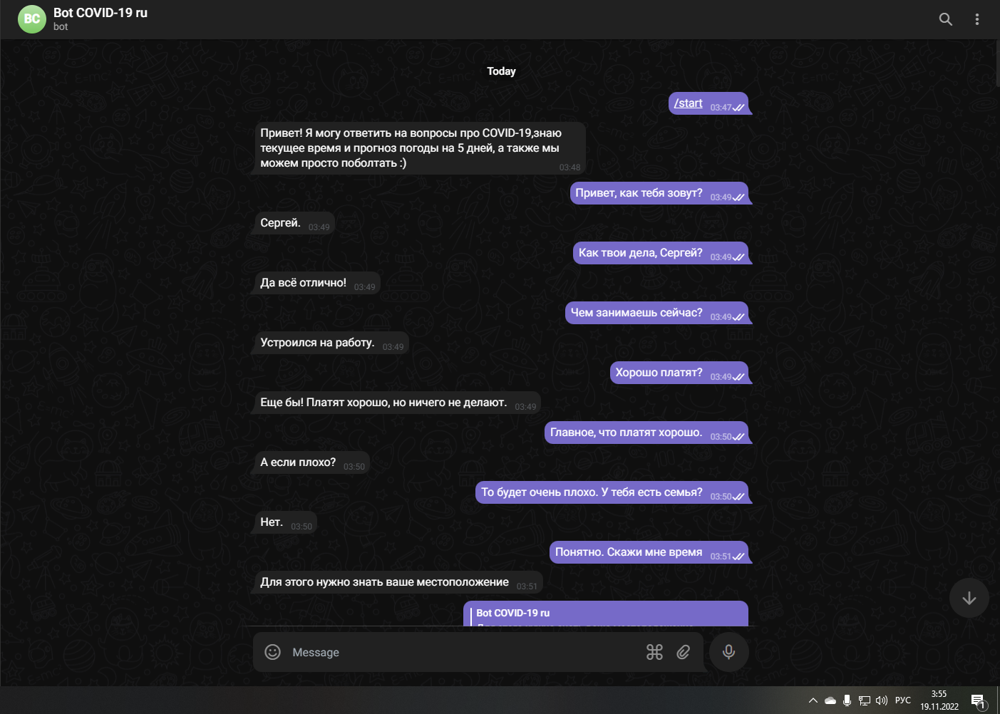

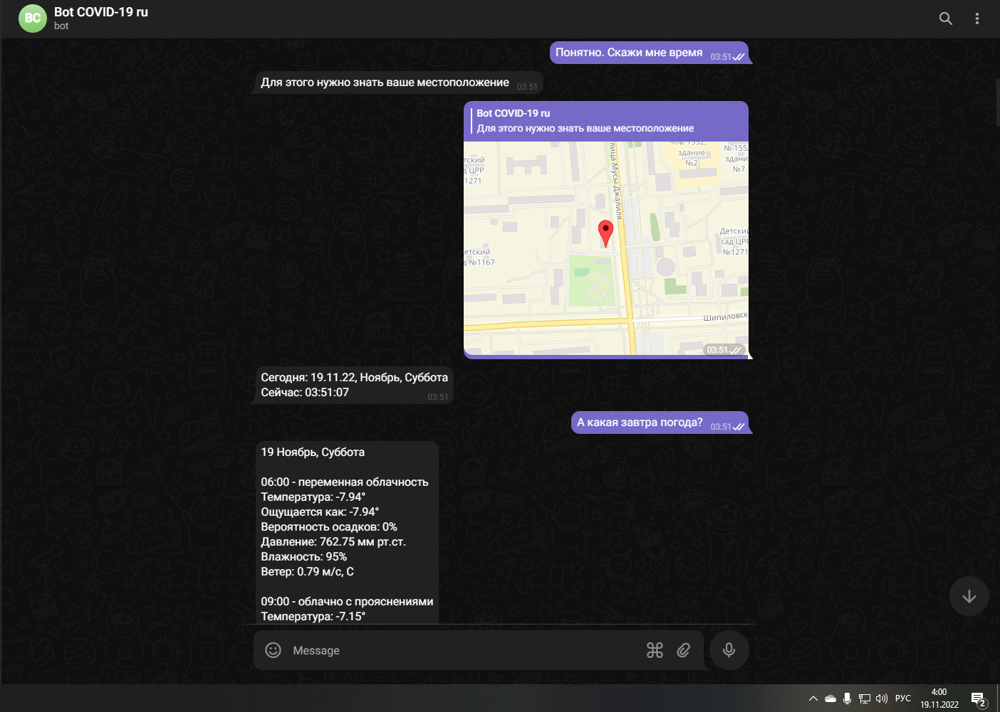

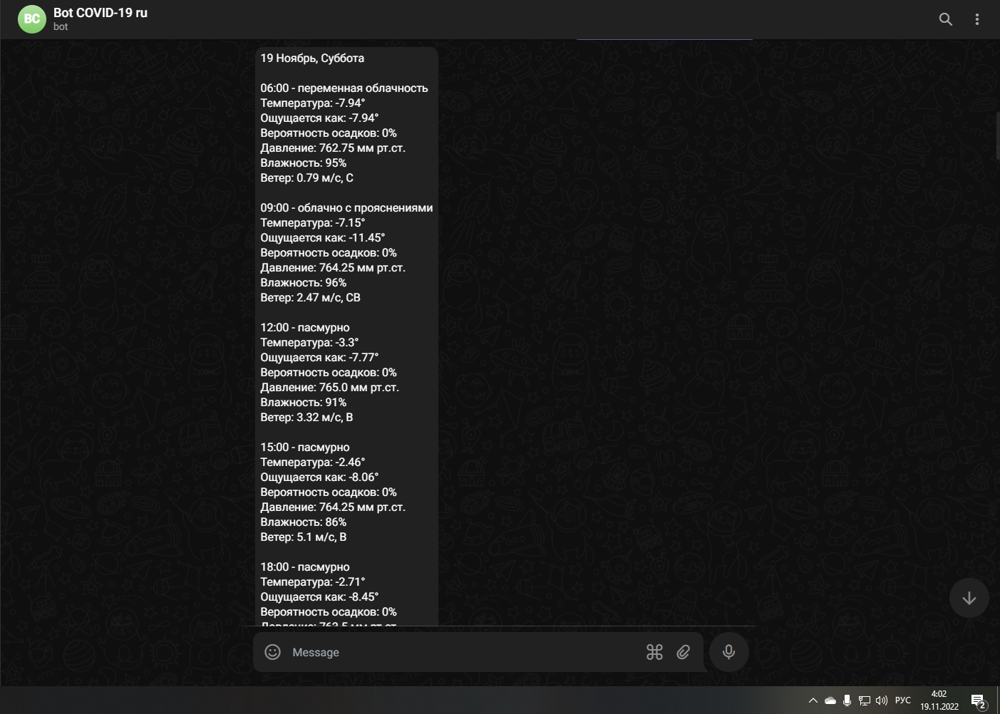

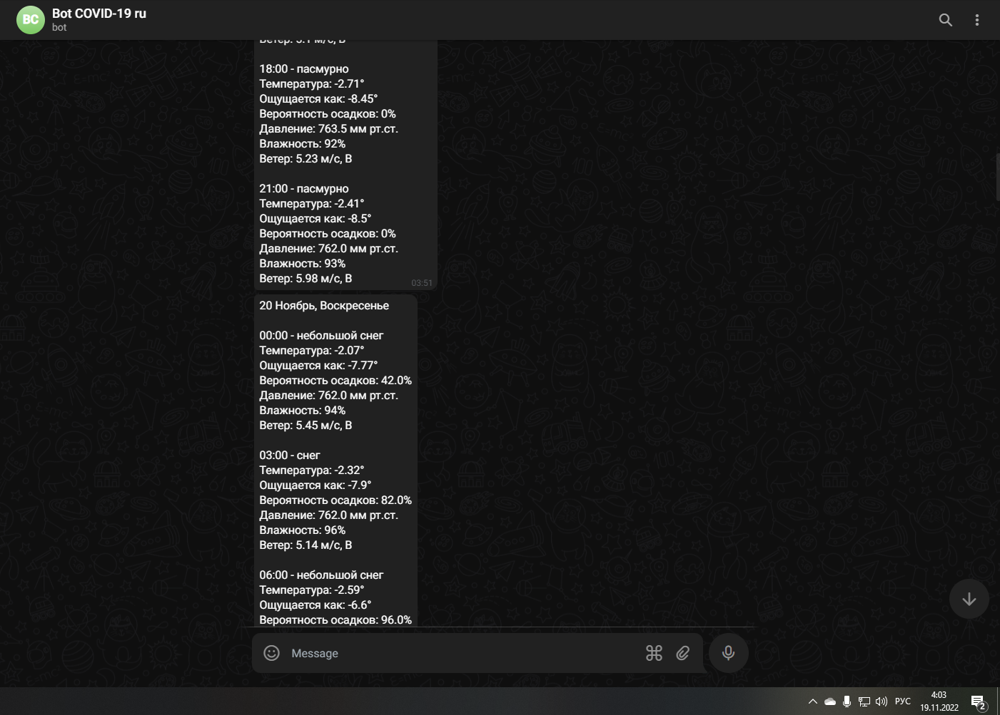

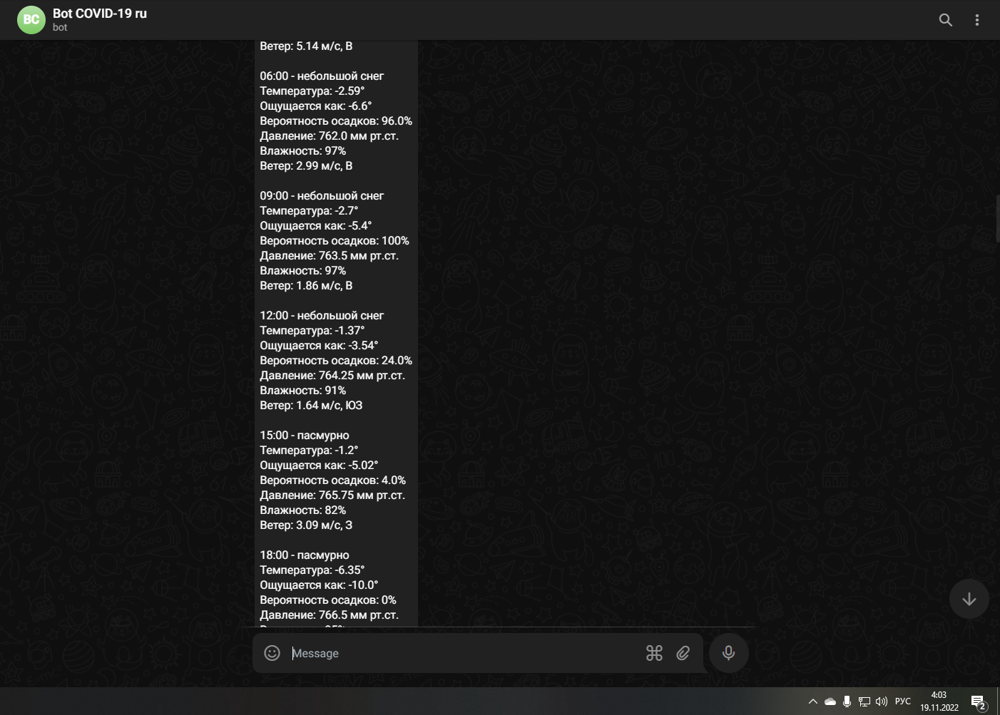

...

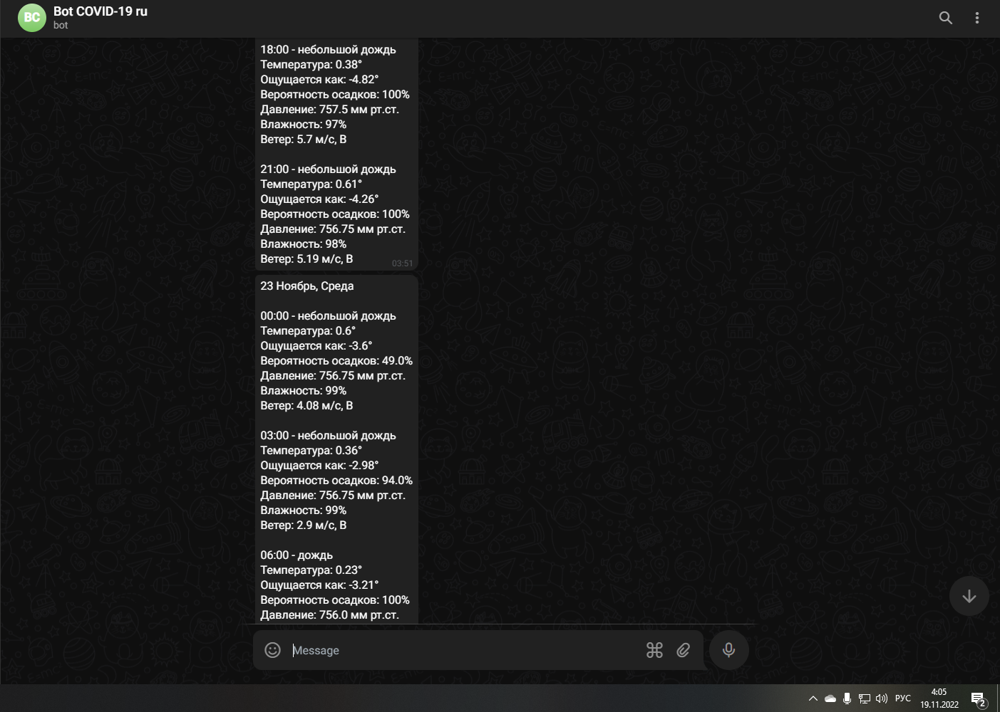

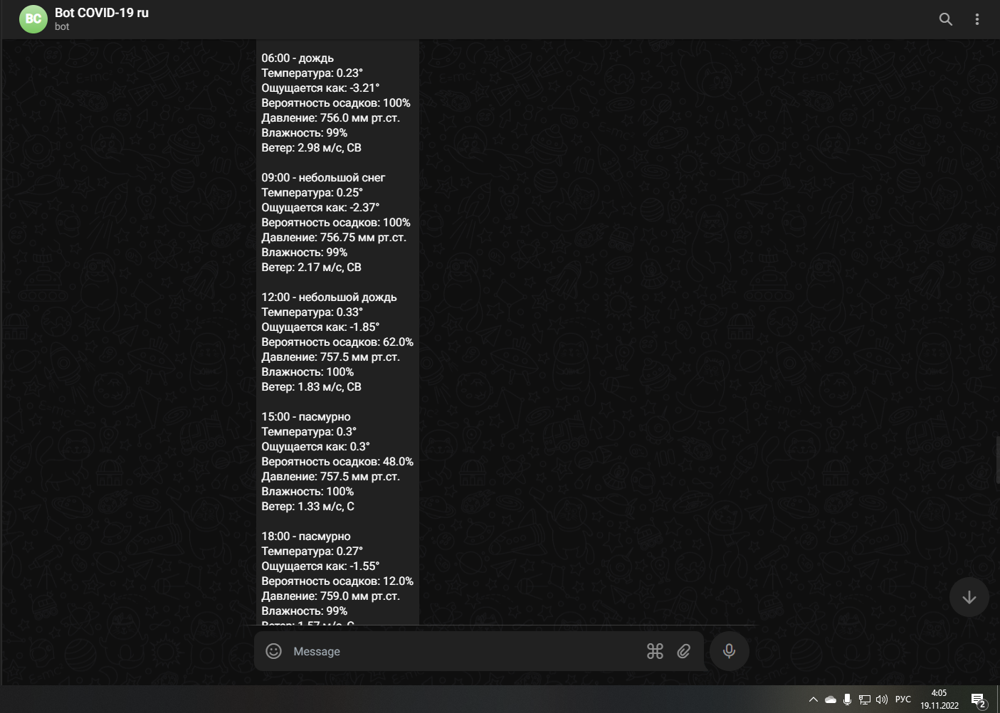

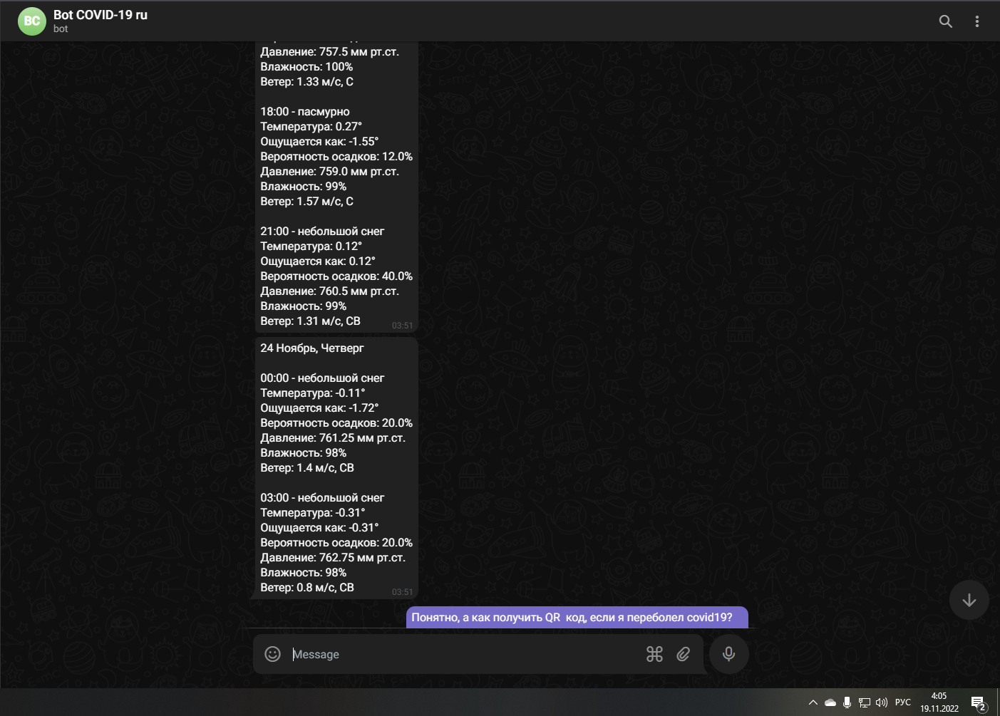

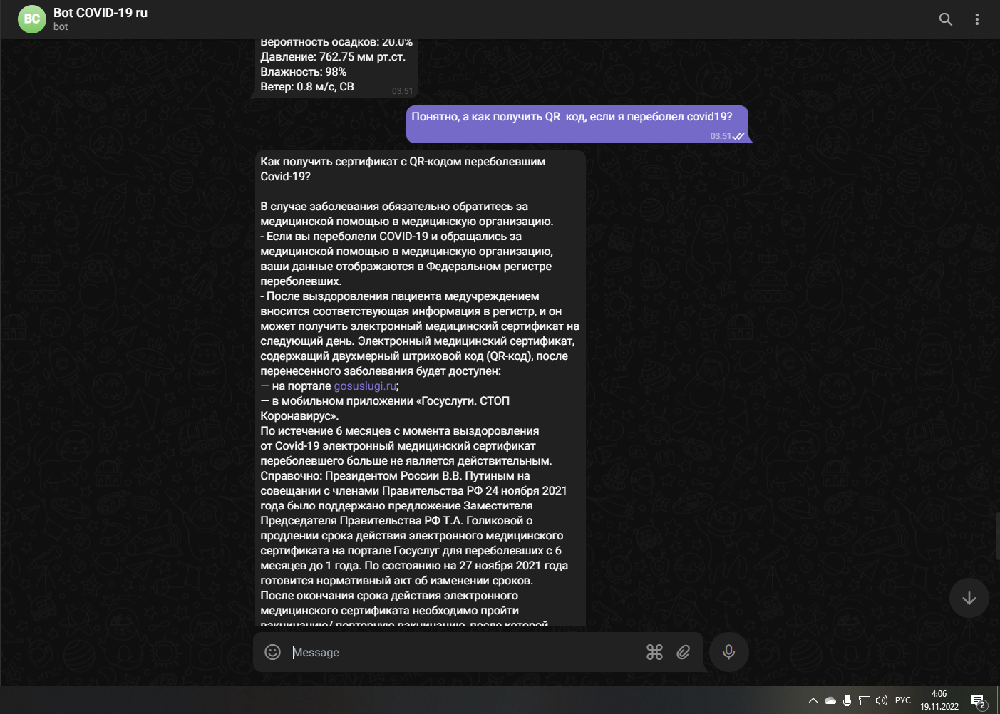

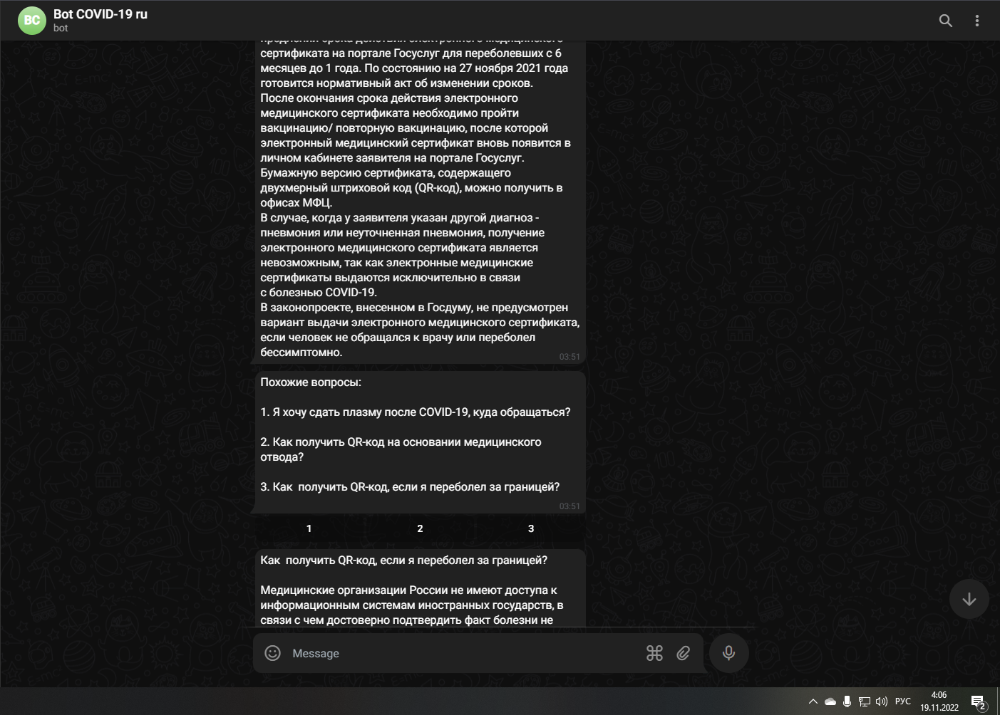

*** Здесь я нажал на кнопку с цифрой 3 ***

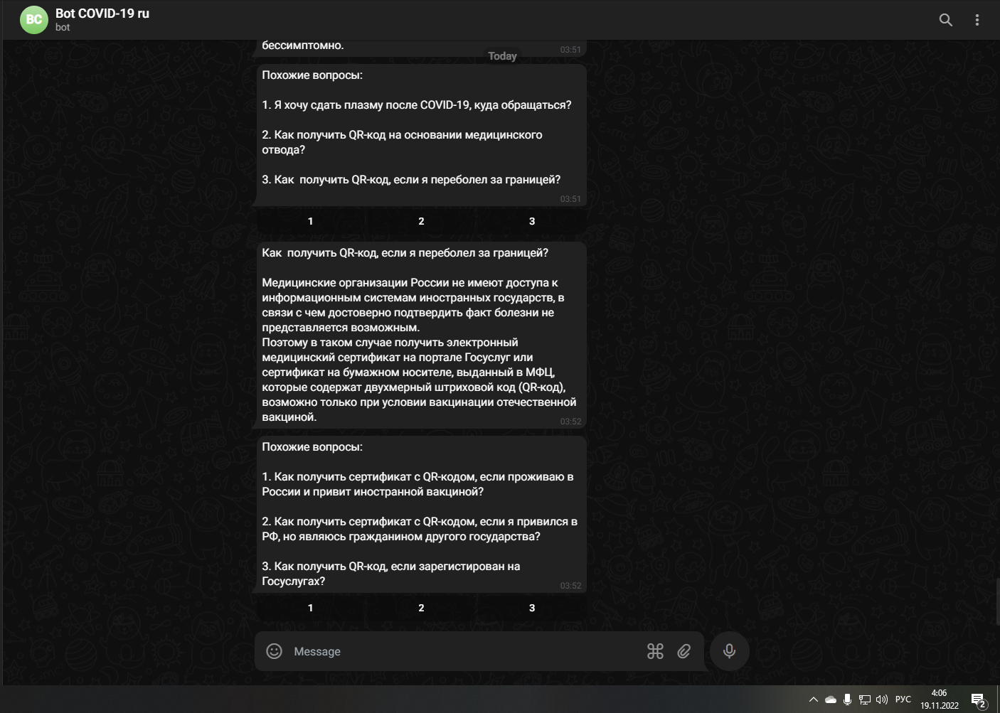

*** Вот так выглядит переписка в телефоне ***

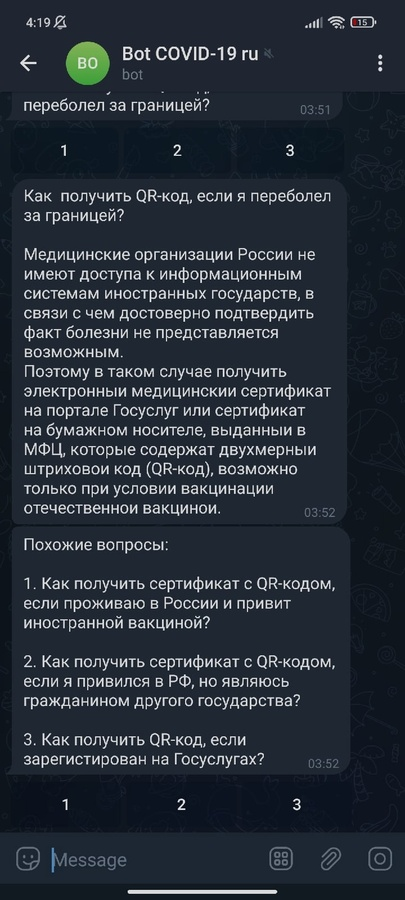

*** Так выглядит кнопка в клавиатуре для отправки местоположения ***

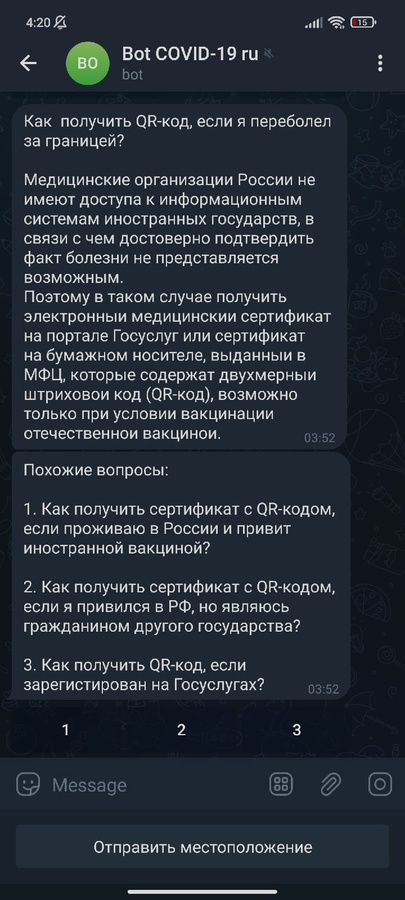

*** После её нажатия спрашивается подтверждение отправки местоположения ***

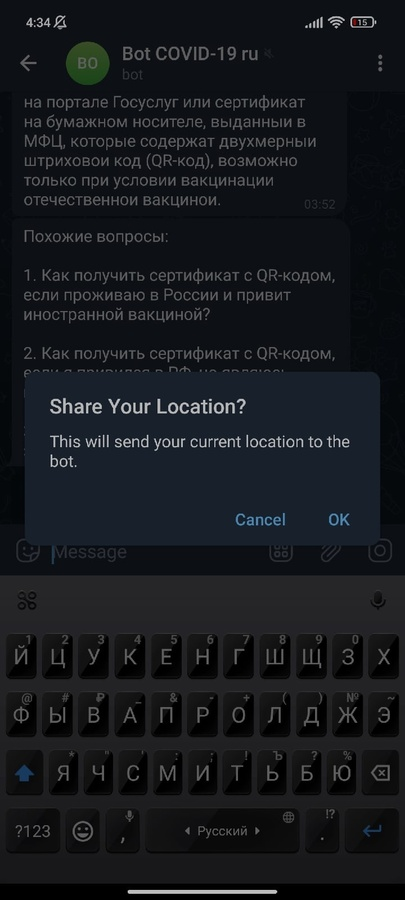

*** И после подтверждения, отправляется геолокация ***

Таким образом, можно обновлять данные о местоположении. Геолокация спрашивается только один раз при новом запуске бота. При перезагрузке бота, все данные стираются. 

Ботом обрабатываются только геолокация, текстовые сообщения и команда /start, которая также стирает всю предыдущую информацию.

### Вывод:

Получился хороший телеграм-бот. 

Сделано всё, что задумывалось.

Что можно сделать лучше:

- Вместо базы данных вопросов про covid19, можно отправлять вопросы в Яндекс и брать от туда короткие ответы. Тогда также нужно будет переобучить классификатор интентов. Получится что-то на подобии Алисы.

- Взять базу данных диалогов лучше той, на которой обучались.

- Найти базу данных (или сделать её самому) для классификации интентов, а не писать фразы вручную.